#### 화장품 리뷰 분석
- 카테고리 분류 
- 긍정/부정 분류

[1] 모듈 로딩 및 데이터 준비 <hr>

In [1]:
## 모듈 로딩
import os
import pandas as pd
import json
from sklearn.preprocessing import LabelEncoder

c:\Users\KDP-27\anaconda3\envs\TORCH_NLP\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from collections import Counter
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader
from torch import optim
from reviewclassifiermodel import reviewClassifierModel
from torch import nn


In [3]:
TRAIN_PATH = './data/Training/'

# 여러 폴더 경로를 리스트로 저장
folder_paths = os.listdir(TRAIN_PATH)

In [4]:
# 빈 데이터프레임 리스트 생성
dataframes = []

In [5]:

# 각 폴더 내의 JSON 파일을 읽어와 데이터프레임으로 변환
for folder_path in folder_paths:
    FOLDER_PATH = TRAIN_PATH+folder_path
    print(f"Processing folder: {folder_path}")
    
    # 폴더 내의 모든 JSON 파일 리스트
    json_files = [file for file in os.listdir(FOLDER_PATH) if file.endswith('.json')]

    for file in json_files:
        file_path = os.path.join(FOLDER_PATH, file)
        print(f"Loading file: {file_path}")
        
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                data = json.load(f)
                
                # 파일 내용 확인 및 데이터프레임으로 변환
                if data:
                    # Aspects만 추출
                    for review in data:
                        aspects = pd.json_normalize(review.get('Aspects'))
                        dataframes.append(aspects)
                else:
                    print(f"No data found in {file}")
                    
        except json.JSONDecodeError:
            print(f"Error loading {file}: Invalid JSON")



Processing folder: 2-1
Loading file: ./data/Training/2-1\2-1.스킨케어(1).json
Loading file: ./data/Training/2-1\2-1.스킨케어(10).json
Loading file: ./data/Training/2-1\2-1.스킨케어(100).json
Loading file: ./data/Training/2-1\2-1.스킨케어(101).json
Loading file: ./data/Training/2-1\2-1.스킨케어(102).json
Loading file: ./data/Training/2-1\2-1.스킨케어(103).json
Loading file: ./data/Training/2-1\2-1.스킨케어(104).json
Loading file: ./data/Training/2-1\2-1.스킨케어(105).json
Loading file: ./data/Training/2-1\2-1.스킨케어(106).json
Loading file: ./data/Training/2-1\2-1.스킨케어(107).json
Loading file: ./data/Training/2-1\2-1.스킨케어(108).json
Loading file: ./data/Training/2-1\2-1.스킨케어(109).json
Loading file: ./data/Training/2-1\2-1.스킨케어(11).json
Loading file: ./data/Training/2-1\2-1.스킨케어(110).json
Loading file: ./data/Training/2-1\2-1.스킨케어(111).json
Loading file: ./data/Training/2-1\2-1.스킨케어(112).json
Loading file: ./data/Training/2-1\2-1.스킨케어(113).json
Loading file: ./data/Training/2-1\2-1.스킨케어(114).json
Loading file: ./data/Traini

In [6]:
# 데이터프레임 결합
if dataframes:
    final_dataframe = pd.concat(dataframes, ignore_index=True)
    print(final_dataframe)
else:
    print("No valid dataframes to concatenate.")
final_dataframe.to_csv('./DATA/Cosmetic_Review.csv')

         Aspect         SentimentText SentimentWord SentimentPolarity
0          유통기한            유통기한도 넉넉하고             2                 1
1          제품구성    구성도 많아서 선물 하기 좋네요.             5                 1
2          제품구성                구성도알차고             1                 1
3       보습력/수분감             촉촉하고너무좋아용             1                 1
4            용량   대용량으로 넉넉하게 사용할 수 있고             5                 1
...         ...                   ...           ...               ...
115831  편의성/활용성     간편하게 하나만 발라도 되어서              4                 1
115832        향            향기도 끝내줍니다.             2                 1
115833        향             좋아하는 향이라              2                 1
115834       가격  할인이 없어서 비싸게 처음 구매했어요             5                -1
115835        향             향이 많이 진해서             3                -1

[115836 rows x 4 columns]


In [7]:
final_dataframe

,Aspect,SentimentText,SentimentWord,SentimentPolarity
0,유통기한,유통기한도 넉넉하고,2,1
1,제품구성,구성도 많아서 선물 하기 좋네요.,5,1
2,제품구성,구성도알차고,1,1
3,보습력/수분감,촉촉하고너무좋아용,1,1
4,용량,대용량으로 넉넉하게 사용할 수 있고,5,1
...,...,...,...,...
115831,편의성/활용성,간편하게 하나만 발라도 되어서,4,1
115832,향,향기도 끝내줍니다.,2,1
115833,향,좋아하는 향이라,2,1
115834,가격,할인이 없어서 비싸게 처음 구매했어요,5,-1


In [8]:
# 	SentimentWord 컬럼 드랍
df_dropped = final_dataframe.drop(columns=['SentimentWord'])

[2] 카테고리 인코딩<hr>

In [9]:
# Aspect 인코딩하기

# LabelEncoder 객체 생성
label_encoder = LabelEncoder()

# '카테고리' 컬럼 라벨링
df_dropped['Aspect_label'] = label_encoder.fit_transform(df_dropped['Aspect'])

df_dropped

,Aspect,SentimentText,SentimentPolarity,Aspect_label
0,유통기한,유통기한도 넉넉하고,1,25
1,제품구성,구성도 많아서 선물 하기 좋네요.,1,29
2,제품구성,구성도알차고,1,29
3,보습력/수분감,촉촉하고너무좋아용,1,10
4,용량,대용량으로 넉넉하게 사용할 수 있고,1,22
...,...,...,...,...
115831,편의성/활용성,간편하게 하나만 발라도 되어서,1,38
115832,향,향기도 끝내줍니다.,1,41
115833,향,좋아하는 향이라,1,41
115834,가격,할인이 없어서 비싸게 처음 구매했어요,-1,0


[3] 'SentimentText' 컬럼 토큰화 <hr>

In [10]:
# 모듈 로딩
from konlpy.tag import Okt
import re
from sklearn.feature_extraction.text import  CountVectorizer, TfidfVectorizer

In [11]:
# Okt 객체 생성
okt = Okt()

In [12]:
# 구두점 제거 함수 정의
def remove_punctuation(text):
    return re.sub(r'[^\w\s]', '', text)

In [13]:
# 'SentimentText' 컬럼을 토큰화하여 리스트에 저장

SentimentText_list = list()
for token in df_dropped['SentimentText']:
    SentimentText_list.append(okt.morphs(remove_punctuation(token)))
type(SentimentText_list[0])

list

In [14]:
SentimentText_list

[['유통', '기한', '도', '넉넉하고'],
 ['구성', '도', '많아서', '선물', '하기', '좋네요'],
 ['구성', '도', '알차고'],
 ['촉촉하고', '너무', '좋아용'],
 ['대', '용량', '으로', '넉넉하게', '사용', '할', '수', '있고'],
 ['무난', '하고', '순한', '편이', '네', '요'],
 ['제품', '구성은', '좋으나'],
 ['가격', '면', '에서', '타', '사이트', '대비', '다소', '비싼', '면', '이', '있습니다'],
 ['이', '구성', '에', '이', '가격', '으로', '사도', '되나', '싶은', '생각', '이', '드는', '제품'],
 ['양도', '많아요'],
 ['끈', '적임', '없이'],
 ['잘', '흡수', '되어', '매우', '만족합니다'],
 ['구성', '알차다고', '좋아하셨어요'],
 ['이', '가격', '에', '이', '구성', '이라니', '너무', '잘', '산', '것', '같아요'],
 ['적립금', '사용', '해서', '저렴하게', '구매', '했습니다'],
 ['촉촉하면서'],
 ['제', '형', '이', '안', '끈', '적거', '려', '요'],
 ['가격', '도', '좋고'],
 ['향', '도', '괜찮고'],
 ['끈', '적임', '별로', '없어', '좋아요'],
 ['좋은', '상품', '구성', '이', '많아', '나눔', '할수있어서', '잘쓰겠습니다'],
 ['크림', '도', '너무', '흡수', '잘', '되서', '좋아요'],
 ['향', '이', '각기', '다르고'],
 ['점성', '이', '부드러워서'],
 ['발림', '성', '좋았음'],
 ['피부', '에', '자극', '없고'],
 ['가격', '대비', '참', '좋은', '상품', '입니다'],
 ['약간', '의', '쑥향', '과', '마향', '이', '신경', '쓰이긴', '하나'],
 ['피부

In [15]:
# 최대 문자열 길이 계산
max_length = max(len(s) for s in SentimentText_list)

print("최대 문자열 길이:", max_length)

최대 문자열 길이: 38


[4] 단어사전 만들기 <hr>

In [16]:
# 토큰을 키로 해서 빈도수 저장
token_freqs={}

# 라인(줄)별 토큰을 읽어서 빈도 체크
for tokenList in SentimentText_list:
    for token in  tokenList:
        # 토큰 키가 존재하지 않으면 키로 추가 후 1로 설정
        if token not in token_freqs:
            token_freqs[token]=1

        else:
            # 이미 존재하는 토큰 키이면 값을 1 증가 
            token_freqs[token] +=1

In [17]:
token_freqs

{'유통': 910,
 '기한': 1022,
 '도': 20127,
 '넉넉하고': 130,
 '구성': 1694,
 '많아서': 496,
 '선물': 85,
 '하기': 2811,
 '좋네요': 2388,
 '알차고': 22,
 '촉촉하고': 1931,
 '너무': 5263,
 '좋아용': 39,
 '대': 427,
 '용량': 2103,
 '으로': 2811,
 '넉넉하게': 47,
 '사용': 6781,
 '할': 1351,
 '수': 1422,
 '있고': 395,
 '무난': 415,
 '하고': 1650,
 '순한': 73,
 '편이': 442,
 '네': 996,
 '요': 3278,
 '제품': 3046,
 '구성은': 72,
 '좋으나': 56,
 '가격': 6484,
 '면': 465,
 '에서': 694,
 '타': 164,
 '사이트': 59,
 '대비': 884,
 '다소': 51,
 '비싼': 379,
 '이': 33349,
 '있습니다': 937,
 '에': 13090,
 '사도': 6,
 '되나': 10,
 '싶은': 36,
 '생각': 1527,
 '드는': 52,
 '양도': 520,
 '많아요': 51,
 '끈': 2748,
 '적임': 1241,
 '없이': 1205,
 '잘': 8742,
 '흡수': 1331,
 '되어': 666,
 '매우': 178,
 '만족합니다': 688,
 '알차다고': 2,
 '좋아하셨어요': 5,
 '이라니': 17,
 '산': 160,
 '것': 5945,
 '같아요': 3400,
 '적립금': 160,
 '해서': 1594,
 '저렴하게': 1617,
 '구매': 1842,
 '했습니다': 709,
 '촉촉하면서': 37,
 '제': 3138,
 '형': 2167,
 '안': 3777,
 '적거': 166,
 '려': 195,
 '좋고': 4403,
 '향': 11011,
 '괜찮고': 232,
 '별로': 1714,
 '없어': 406,
 '좋아요': 6360,
 '좋은': 3329,
 '

In [18]:
### 빈도별로 몇 개의 단어가 존재하는지 체크
token_freqs.items()

dict_items([('유통', 910), ('기한', 1022), ('도', 20127), ('넉넉하고', 130), ('구성', 1694), ('많아서', 496), ('선물', 85), ('하기', 2811), ('좋네요', 2388), ('알차고', 22), ('촉촉하고', 1931), ('너무', 5263), ('좋아용', 39), ('대', 427), ('용량', 2103), ('으로', 2811), ('넉넉하게', 47), ('사용', 6781), ('할', 1351), ('수', 1422), ('있고', 395), ('무난', 415), ('하고', 1650), ('순한', 73), ('편이', 442), ('네', 996), ('요', 3278), ('제품', 3046), ('구성은', 72), ('좋으나', 56), ('가격', 6484), ('면', 465), ('에서', 694), ('타', 164), ('사이트', 59), ('대비', 884), ('다소', 51), ('비싼', 379), ('이', 33349), ('있습니다', 937), ('에', 13090), ('사도', 6), ('되나', 10), ('싶은', 36), ('생각', 1527), ('드는', 52), ('양도', 520), ('많아요', 51), ('끈', 2748), ('적임', 1241), ('없이', 1205), ('잘', 8742), ('흡수', 1331), ('되어', 666), ('매우', 178), ('만족합니다', 688), ('알차다고', 2), ('좋아하셨어요', 5), ('이라니', 17), ('산', 160), ('것', 5945), ('같아요', 3400), ('적립금', 160), ('해서', 1594), ('저렴하게', 1617), ('구매', 1842), ('했습니다', 709), ('촉촉하면서', 37), ('제', 3138), ('형', 2167), ('안', 3777), ('적거', 166), ('려', 195), ('좋고', 4

In [19]:
# 빈도별로 단어 또는 단어 개수 저장
freqsDict = {}

for k, v in token_freqs.items():
    if v not in freqsDict:
        freqsDict[v] = [1, [k]]  # [개수, [단어 목록]]
    else:
        freqsDict[v][0] += 1  # 개수 증가
        freqsDict[v][1].append(k)  # 단어 추가

print(freqsDict)

{910: [2, ['유통', '사']], 1022: [1, ['기한']], 20127: [1, ['도']], 130: [4, ['넉넉하고', '테', '살', '일반']], 1694: [1, ['구성']], 496: [2, ['많아서', '촉촉하니']], 85: [8, ['선물', '작아', '촉촉함은', '발려요', '당김도', '며칠', '거부', '진하게']], 2811: [2, ['하기', '으로']], 2388: [1, ['좋네요']], 22: [69, ['알차고', '습', '큐어', '촉촉해지네요', '봐도', '생겼어요', '난후', '10분', '참고', '봐', '리치', '만족스럽고', '비싸지', '욕실', '있는게', '해주면', '한여름', '펴지고', '의사', '땡김이', '덜합니다', '고해', '덤', '잤는데', '가볍지도', '개수', '땡기지', '좋아졌다고', '올라오는', '적당하게', '만족하는', '씻기는', '꼼꼼히', '없어지는', '안되어서', '과도', '보지', '흘러', '따갑네요', '두드려도', '모르겠으나', '겠어요', '마니', '좋다네요', '자연스러워서', '독하고', '팔자', '적지', '없는거', '간편한', '흐르고', '오늘', '드려요', '뛰어나서', '쟁', '힘듭니다', '시원함이', '시원하니', '살아나는', '완성', '가면', '나은', '비닐', '어나', '갈리는', '곱슬', '연한', '나왔습니다', '다크닝']], 1931: [1, ['촉촉하고']], 5263: [1, ['너무']], 39: [26, ['좋아용', '효능', '써요', '해보고', '립니', '약해요', '깜짝', '있긴', '넉넉해요', '문제', '섞어', '다행', '스러운', '포장', '설명', '많은데', '하긴', '하세요', '액체', '번지', '발라주고', '틴트', '왁스', '빠집니다', '밝아서', '호가']], 427: [1, ['대']], 2103: [1, ['용량'

In [20]:
total=len(token_freqs)
total

23039

In [21]:
## 단어사전 생성 및 초기화
## 특수토큰 : 'PAD', 'OOV' 또는 'UNK'
PAD_TOKEN, OOV_TOKEN= 'PAD', 'OOV'

vocab={ PAD_TOKEN: 0, OOV_TOKEN:1}

In [22]:
## 데이터 코퍼스에서 추출된 토큰(단어)들

for idx, tk in enumerate(token_freqs,2):
    vocab[tk[0]]=idx
print(vocab)

{'PAD': 0, 'OOV': 1, '유': 22539, '기': 22410, '도': 22518, '넉': 23032, '구': 21937, '많': 22254, '선': 22635, '하': 23039, '좋': 22831, '알': 22951, '촉': 22712, '너': 14386, '대': 22954, '용': 22275, '으': 16038, '사': 22818, '할': 22813, '수': 22887, '있': 23015, '무': 22957, '순': 23009, '편': 23018, '네': 22352, '요': 20774, '제': 21688, '가': 22976, '면': 22913, '에': 22703, '타': 22799, '다': 23028, '비': 22998, '이': 22938, '되': 23016, '싶': 22493, '생': 22901, '드': 22206, '양': 21576, '끈': 22946, '적': 22948, '없': 22870, '잘': 22982, '흡': 18514, '매': 22964, '만': 22917, '산': 22797, '것': 18865, '같': 21730, '해': 22791, '저': 22574, '했': 22670, '형': 23024, '안': 22826, '려': 21670, '향': 21768, '괜': 22968, '별': 18195, '상': 23020, '나': 22931, '크': 22515, '각': 21801, '점': 21575, '부': 23026, '발': 23033, '성': 22883, '피': 22851, '자': 22962, '참': 20876, '입': 22504, '약': 22332, '의': 21620, '쑥': 9882, '과': 16874, '마': 22809, '신': 22867, '쓰': 22929, '트': 22485, '은': 22671, '와': 21292, '그': 22857, '묽': 17887, '느': 22984, '쿠': 193

In [23]:
# 텍스트 문장 ==> 수치화[인코딩]
encodingData = []

for tokenList in SentimentText_list: 
    sent = []
    print(f'문장 : {tokenList}')

    for token in tokenList:
        sent.append(vocab.get(token, vocab[OOV_TOKEN]))  # 기본값 :  OOV_TOKEN

    # 인코딩 된 문장 저장
    encodingData.append(sent)
    print(f'==> 인코딩 : {sent}')

문장 : ['유통', '기한', '도', '넉넉하고']
==> 인코딩 : [1, 1, 22518, 1]
문장 : ['구성', '도', '많아서', '선물', '하기', '좋네요']
==> 인코딩 : [1, 22518, 1, 1, 1, 1]
문장 : ['구성', '도', '알차고']
==> 인코딩 : [1, 22518, 1]
문장 : ['촉촉하고', '너무', '좋아용']
==> 인코딩 : [1, 1, 1]
문장 : ['대', '용량', '으로', '넉넉하게', '사용', '할', '수', '있고']
==> 인코딩 : [22954, 1, 1, 1, 1, 22813, 22887, 1]
문장 : ['무난', '하고', '순한', '편이', '네', '요']
==> 인코딩 : [1, 1, 1, 1, 22352, 20774]
문장 : ['제품', '구성은', '좋으나']
==> 인코딩 : [1, 1, 1]
문장 : ['가격', '면', '에서', '타', '사이트', '대비', '다소', '비싼', '면', '이', '있습니다']
==> 인코딩 : [1, 22913, 1, 22799, 1, 1, 1, 1, 22913, 22938, 1]
문장 : ['이', '구성', '에', '이', '가격', '으로', '사도', '되나', '싶은', '생각', '이', '드는', '제품']
==> 인코딩 : [22938, 1, 22703, 22938, 1, 1, 1, 1, 1, 1, 22938, 1, 1]
문장 : ['양도', '많아요']
==> 인코딩 : [1, 1]
문장 : ['끈', '적임', '없이']
==> 인코딩 : [22946, 1, 1]
문장 : ['잘', '흡수', '되어', '매우', '만족합니다']
==> 인코딩 : [22982, 1, 1, 1, 1]
문장 : ['구성', '알차다고', '좋아하셨어요']
==> 인코딩 : [1, 1, 1]
문장 : ['이', '가격', '에', '이', '구성', '이라니', '너무', '잘', '산', '것', '같아요']
==

In [24]:
max([len(sent) for sent in encodingData]),min([len(sent) for sent in encodingData])

(38, 1)

In [25]:
dataLen=[len(sent) for sent in encodingData]
print(dataLen)

[4, 6, 3, 3, 8, 6, 3, 11, 13, 2, 3, 5, 3, 11, 6, 1, 8, 3, 3, 5, 8, 7, 4, 3, 3, 4, 6, 9, 4, 3, 8, 5, 2, 2, 3, 3, 10, 8, 2, 3, 3, 8, 9, 7, 4, 3, 4, 5, 22, 2, 8, 3, 6, 5, 5, 2, 4, 4, 7, 6, 2, 3, 6, 6, 9, 4, 3, 4, 10, 3, 6, 11, 9, 5, 3, 3, 6, 10, 3, 6, 4, 3, 2, 5, 5, 6, 6, 5, 5, 5, 9, 4, 3, 2, 4, 4, 10, 9, 4, 7, 3, 7, 3, 9, 9, 5, 3, 10, 3, 2, 1, 4, 2, 3, 18, 6, 6, 6, 6, 5, 6, 10, 6, 7, 8, 5, 3, 1, 5, 1, 3, 3, 3, 2, 1, 5, 1, 9, 8, 3, 8, 4, 5, 4, 3, 3, 8, 10, 3, 3, 9, 5, 2, 1, 6, 5, 5, 6, 7, 6, 8, 3, 7, 6, 7, 8, 5, 6, 1, 4, 4, 4, 1, 7, 5, 3, 3, 7, 3, 10, 5, 3, 1, 2, 3, 3, 4, 5, 6, 5, 6, 7, 6, 6, 9, 7, 6, 8, 8, 2, 3, 3, 3, 12, 5, 3, 1, 4, 3, 4, 4, 10, 3, 5, 6, 3, 3, 6, 4, 5, 9, 6, 4, 2, 11, 5, 6, 1, 7, 8, 11, 5, 1, 1, 7, 4, 5, 6, 2, 5, 5, 2, 5, 3, 4, 3, 3, 2, 4, 5, 5, 4, 3, 6, 6, 4, 16, 1, 3, 4, 9, 5, 8, 9, 7, 1, 5, 7, 9, 9, 5, 1, 4, 1, 10, 6, 5, 4, 3, 7, 5, 5, 15, 7, 9, 6, 5, 8, 16, 10, 13, 8, 4, 7, 7, 7, 4, 6, 5, 11, 2, 6, 5, 3, 3, 4, 9, 5, 6, 4, 7, 9, 4, 8, 1, 4, 1, 5, 9, 12, 6, 4, 7, 5, 1

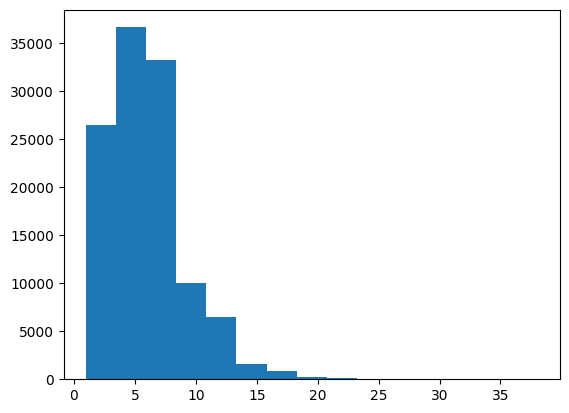

In [26]:
import matplotlib.pyplot as plt

plt.hist(dataLen,bins=15)
plt.show()

In [27]:
## 기준 길이
MAX_LENGTH = max(dataLen)
MAX_LENGTH

38

In [28]:
### [1] 가장 긴 문장 길이 기준
for idx,sent in enumerate(encodingData):
    cur_length=len(sent)
    if cur_length<MAX_LENGTH:
        encodingData[idx]=sent+([0]*(MAX_LENGTH-cur_length))

In [29]:
for _ in encodingData[:3]:
    print(len(_),_)

38 [1, 1, 22518, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
38 [1, 22518, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
38 [1, 22518, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


[5] 학습 <hr>

In [30]:
# 학습함수
def model_train(model, datasets, cl_criterion, bn_criterion, optimizer, device, interval):
    model.train()
    losses = []

    for step, (input_ids, labels) in enumerate(datasets):
        input_ids = input_ids.to(device)                    # 인풋데이터
        cl_labels = labels[:, 0].to(device)                 # 라벨 다중분류
        bn_labels = labels[:, 1].to(device).float()         # 라벨 2진분류  (float형)

        # Forward pass
        classesd, logits = model(input_ids)

        # Calculate losses
        loss_cl = cl_criterion(classesd, cl_labels)         # 
        loss_bn = bn_criterion(logits.squeeze(), bn_labels) # 
        loss = loss_cl + loss_bn
        losses.append(loss.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if step % interval == 0:
            print(f'Train Loss {step} : {np.mean(losses)}')


In [31]:
# test 함수

def model_test(model, datasets, cl_criterion, bn_criterion, device):
    model.eval()
    losses = []
    cl_score = []
    bn_score = []

    with torch.no_grad(): 
        for step, (input_ids, labels) in enumerate(datasets):
            input_ids = input_ids.to(device)
            cl_labels = labels[:, 0].to(device).long()
            bn_labels = labels[:, 1].to(device).float() 

            # Forward pass
            classesd, logits = model(input_ids)

            # Calculate losses
            loss_cl = cl_criterion(classesd, cl_labels)
            loss_bn = bn_criterion(logits.squeeze(), bn_labels)
            loss = loss_cl + loss_bn
            losses.append(loss.item())
            
            # Calculate class accuracy
            cl_predictions = torch.argmax(torch.softmax(classesd, dim=1), dim=1)  # 다중 클래스 예측
            cl_score.extend(cl_predictions.eq(cl_labels).cpu().numpy())  # 정확도 계산
            
            # Calculate binary accuracy
            bn_predictions = (torch.sigmoid(logits) > 0.5).int().squeeze()  # 이진 예측
            bn_score.extend(bn_predictions.eq(bn_labels.int()).cpu().numpy())  # 정확도 계산
        
        # 정확도 계산
        cl_accuracy = np.mean(cl_score)
        bn_accuracy = np.mean(bn_score)
        
        print(f'Val Loss : {np.mean(losses)} , bn_score Val Accuracy : {bn_accuracy}, cl_score Val Accuracy : {cl_accuracy}')


In [32]:
# main 실행 함수 


def main():
    N_VOCAB = 5000
    MAX_LENGTH = 32
    EPOCHS = 100
    INTERVAL = 500
    BATCH_SIZE = 16
    LR = 0.001
    special_tokens = ['<pad>', '<unk>']

    trainDF, testDF = load_data('./DATA/Cosmetic_Review.csv')

    trainDF, aspectCD = data_encoding(trainDF)
    testDF, _ = data_encoding(testDF)

    tokenizer = Okt()
    train_tokens = [tokenizer.morphs(review) for review in trainDF['SentimentText']]
    test_tokens = [tokenizer.morphs(review) for review in testDF['SentimentText']]

    vocab = build_vocab(train_tokens, N_VOCAB, special_tokens)
    token_to_id = {token: idx for idx, token in enumerate(vocab)}
    id_to_token = {idx: token for idx, token in enumerate(vocab)}

    pad_id = token_to_id['<pad>']
    unk_id = token_to_id['<unk>']
    train_ids = encoding_ids(token_to_id, train_tokens, unk_id)
    test_ids = encoding_ids(token_to_id, test_tokens, unk_id)
    train_ids = pad_sequences(train_ids, MAX_LENGTH, pad_id)
    test_ids = pad_sequences(test_ids, MAX_LENGTH, pad_id)

    train_ids = torch.tensor(train_ids, dtype=torch.long)
    test_ids = torch.tensor(test_ids, dtype=torch.long)

    train_labels = torch.tensor(list(zip(trainDF['Aspect'].values, trainDF['SentimentPolarity'].values)), dtype=torch.long)
    test_labels = torch.tensor(list(zip(testDF['Aspect'].values, testDF['SentimentPolarity'].values)), dtype=torch.float32)

    train_dataset = TensorDataset(train_ids, train_labels)
    test_dataset = TensorDataset(test_ids, test_labels)

    train_loader = DataLoader(train_dataset, BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, BATCH_SIZE, shuffle=False)

    n_vocab = len(token_to_id)
    hidden_dim = 64
    embedding_dim = 128
    n_layers = 2
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    classifier = reviewClassifierModel(
        n_vocab=n_vocab, hidden_dim=hidden_dim, embedding_dim=embedding_dim, n_classes=len(aspectCD), n_layers=n_layers
    ).to(device)

    cl_criterion = nn.CrossEntropyLoss().to(device)
    bn_criterion = nn.BCEWithLogitsLoss().to(device)
    optimizer = optim.RMSprop(classifier.parameters(), lr=LR)

    for epoch in range(EPOCHS):
        model_train(classifier, train_loader, cl_criterion, bn_criterion, optimizer, device, INTERVAL)
        model_test(classifier, test_loader, cl_criterion, bn_criterion, device)
